In [3]:
import pandas as pd
import numpy as np
import os

In [5]:
path_to_data = '../data/coswara'
assert os.path.exists(path_to_data)

In [7]:
csv_file = os.path.join(path_to_data, 'combined_data.csv')
df = pd.read_csv(csv_file)

In [8]:
df

,id,a,covid_status,record_date,ep,g,l_c,l_l,l_s,rU,...,vacc,bd,others_resp,ftg,st,ihd,asthma,others_preexist,cld,pneumonia
0,iV3Db6t1T8b7c5HQY2TwxIhjbzD3,28,healthy,2020-04-23,y,male,India,Anantapur,Andhra Pradesh,n,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AxuYWBN0jFVLINCBqIW5aZmGCdu1,25,healthy,2020-04-20,y,male,India,BENGALURU URBAN,Karnataka,n,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,C5eIsssb9GSkaAgIfsHMHeR6fSh1,28,healthy,2020-04-24,y,female,United States,Pittsburgh,Pennsylvania,n,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,YjbEAECMBIaZKyfqOvWy5DDImUb2,26,healthy,2020-04-23,y,male,India,Bangalore,Karnataka,n,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,aGOvk4ji0cVqIzCs1jHnzlw2UEy2,32,healthy,2020-04-22,y,male,India,Nalanda,Bihar,n,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2228,333NjqA1TfZJuICEdXSkPhVz0LA3,48,positive_asymp,2021-07-13,y,male,India,Thondamuthur,Tamil Nadu,n,...,p,NaN,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN
2229,dpA0EeRrtJUeKJjEuf7BL0AeTJZ2,36,positive_mild,2021-07-06,y,male,India,MSRMC,Karnataka,n,...,p,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2230,UXhG3vgoxkWtd4Meky1nm0sRgMV2,76,positive_mild,2021-07-13,y,male,India,Coimbatore,Tamil Nadu,n,...,y,NaN,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN
2231,A5KW9PXraNgckln1gnNaJnX6DvB2,25,positive_moderate,2021-07-01,y,male,India,Coimbatore,Tamil Nadu,n,...,p,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
filt = ['covid_status', 'test_status', 'a', 'g']
df = df[filt]
df

,covid_status,test_status,a,g
0,healthy,NaN,28,male
1,healthy,NaN,25,male
2,healthy,NaN,28,female
3,healthy,NaN,26,male
4,healthy,NaN,32,male
...,...,...,...,...
2228,positive_asymp,p,48,male
2229,positive_mild,p,36,male
2230,positive_mild,p,76,male
2231,positive_moderate,p,25,male


In [49]:
df.describe(include='all')

,covid_status,test_status,a,g
count,2233,820,2233.000000,2233
unique,7,3,NaN,3
top,healthy,p,NaN,male
freq,1379,389,NaN,1579
mean,NaN,NaN,35.343036,NaN
std,NaN,NaN,13.965415,NaN
min,NaN,NaN,1.000000,NaN
25%,NaN,NaN,25.000000,NaN
50%,NaN,NaN,31.000000,NaN
75%,NaN,NaN,44.000000,NaN


In [42]:
def filter_by_test_status(df):
    df = df[pd.notna(df['test_status'])]
    df = df[df['test_status'] != 'na']
    return df

In [51]:
filter_by_test_status(df)

,covid_status,test_status,a,g
28,positive_moderate,p,67,male
29,healthy,n,24,male
32,recovered_full,p,38,male
33,positive_moderate,p,57,female
34,positive_moderate,p,47,male
...,...,...,...,...
2228,positive_asymp,p,48,male
2229,positive_mild,p,36,male
2230,positive_mild,p,76,male
2231,positive_moderate,p,25,male


In [50]:
df.covid_status.unique()

array(['healthy', 'no_resp_illness_exposed',
       'resp_illness_not_identified', 'positive_moderate',
       'recovered_full', 'positive_mild', 'positive_asymp'], dtype=object)

In [53]:
def filter_by_covid_status(df):
    include = ['healthy', 'positive_moderate', 'positive_mild',]
               # 'positive_asymp', 'recovered_full']
    df = df[df['covid_status'].isin(include)]
    return df

In [55]:
filtered = filter_by_covid_status(df)

In [56]:
filtered.covid_status.value_counts()

healthy              1379
positive_mild         261
positive_moderate     118
Name: covid_status, dtype: int64

In [58]:
261 + 118
# total number of positive examples when filtering by covid status label

379

# working with filtered dataset after extraction script

In [1]:
import pydub
import simpleaudio
import librosa

In [4]:
path_to_data = '../data/coswara/'
csv_file = os.path.join(path_to_data, 'filtered_data.csv')
df = pd.read_csv(csv_file)

In [5]:
df

,Unnamed: 0,id,a,covid_status,record_date,ep,g,l_c,l_l,l_s,...,vacc,bd,others_resp,ftg,st,ihd,asthma,others_preexist,cld,pneumonia
0,0,iV3Db6t1T8b7c5HQY2TwxIhjbzD3,28,healthy,2020-04-23,y,male,India,Anantapur,Andhra Pradesh,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,AxuYWBN0jFVLINCBqIW5aZmGCdu1,25,healthy,2020-04-20,y,male,India,BENGALURU URBAN,Karnataka,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,C5eIsssb9GSkaAgIfsHMHeR6fSh1,28,healthy,2020-04-24,y,female,United States,Pittsburgh,Pennsylvania,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,YjbEAECMBIaZKyfqOvWy5DDImUb2,26,healthy,2020-04-23,y,male,India,Bangalore,Karnataka,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,aGOvk4ji0cVqIzCs1jHnzlw2UEy2,32,healthy,2020-04-22,y,male,India,Nalanda,Bihar,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1753,2227,q9AJkEfjEtQYaUFVbbFl1cN7TKH3,50,positive_mild,2021-07-14,y,male,India,Coimbatore,Tamil Nadu,...,p,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1754,2229,dpA0EeRrtJUeKJjEuf7BL0AeTJZ2,36,positive_mild,2021-07-06,y,male,India,MSRMC,Karnataka,...,p,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1755,2230,UXhG3vgoxkWtd4Meky1nm0sRgMV2,76,positive_mild,2021-07-13,y,male,India,Coimbatore,Tamil Nadu,...,y,NaN,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN
1756,2231,A5KW9PXraNgckln1gnNaJnX6DvB2,25,positive_moderate,2021-07-01,y,male,India,Coimbatore,Tamil Nadu,...,p,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# Now let's visualize and listen to some sounds!!
import librosa
import IPython
audio_path = os.path.join(path_to_data, 'audio')
audio_files = os.listdir(audio_path)
audio_file = os.path.join(audio_path, audio_files[0])
x, sr = librosa.load(audio_file)
print(x.shape) # audio array
print(sr) # sampling rate

(114778,)
22050


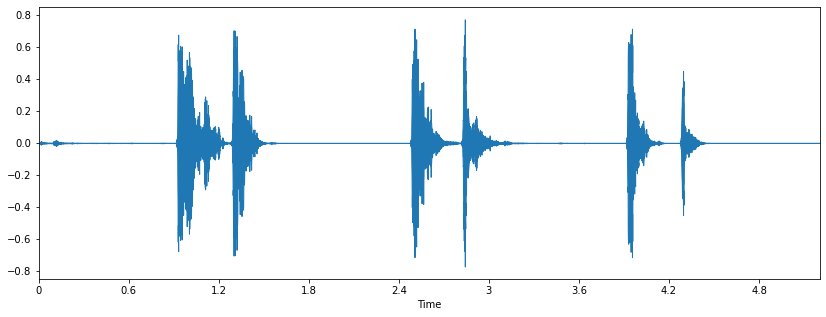

In [11]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

In [12]:
import IPython.display as ipd
ipd.Audio(audio_file)

In [16]:
files = [os.path.join(audio_path, audio_files[i])
         for i in range(0,10)]
samples = [librosa.load(f) for f in files]

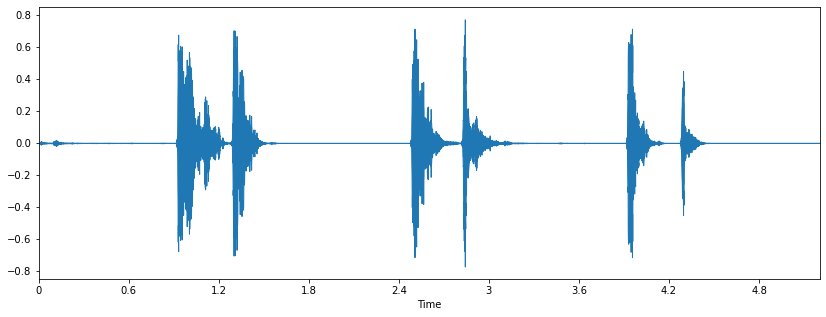

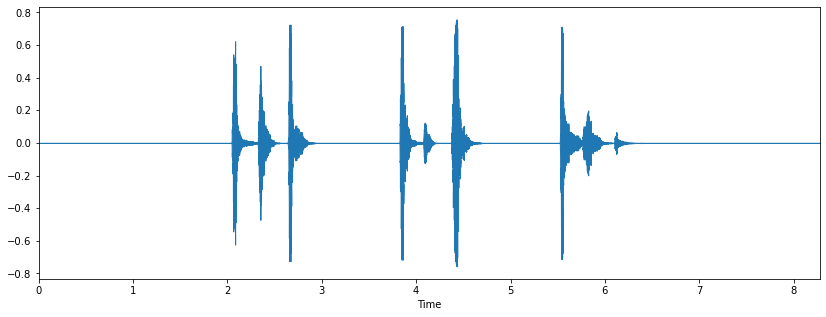

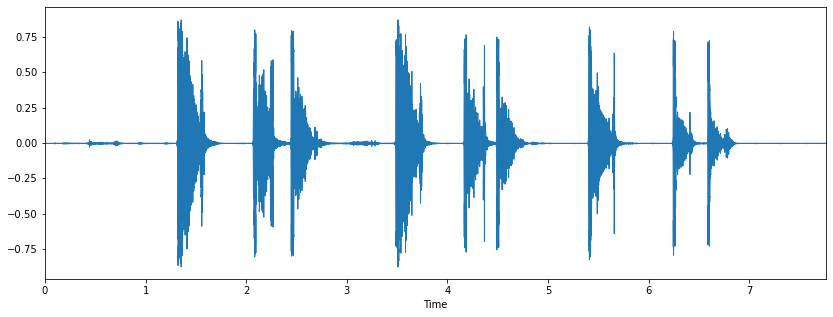

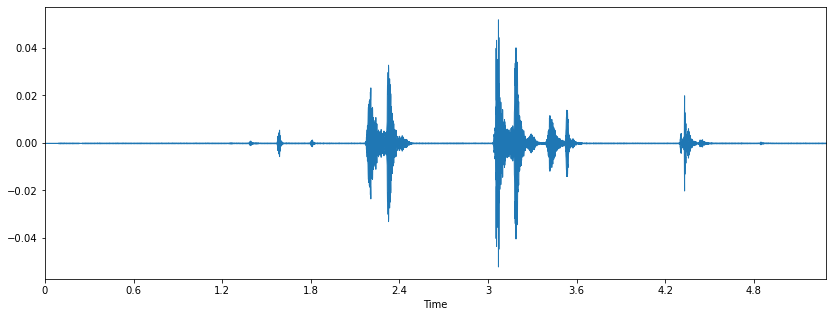

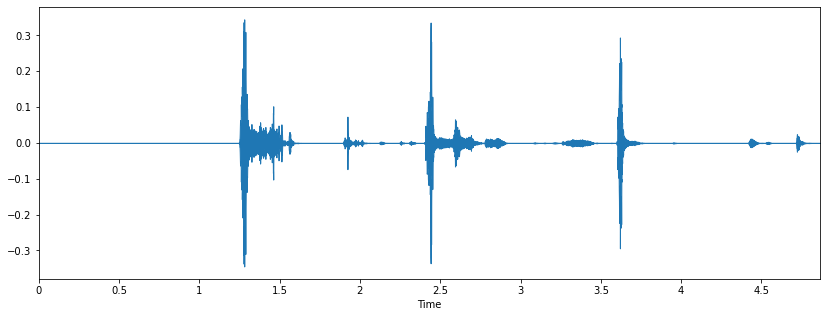

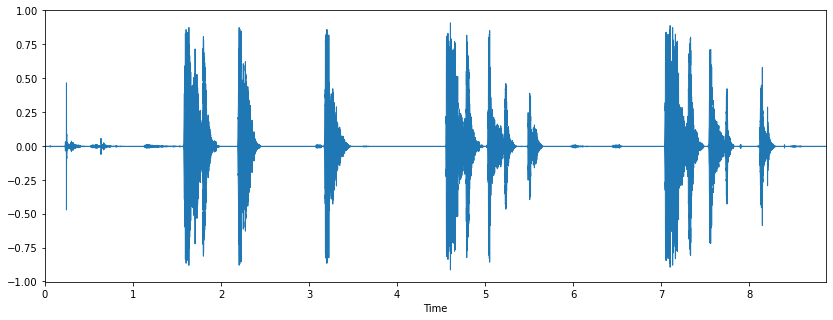

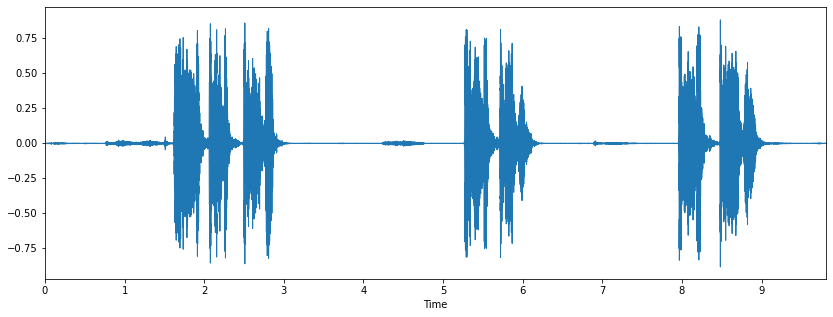

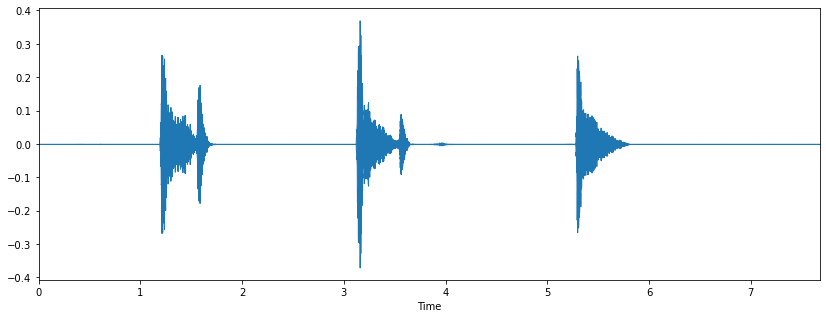

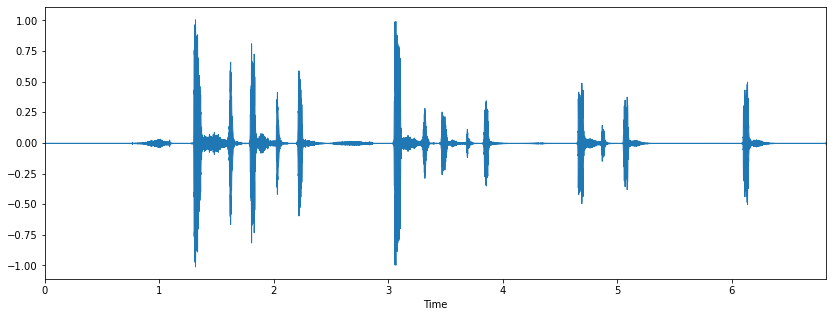

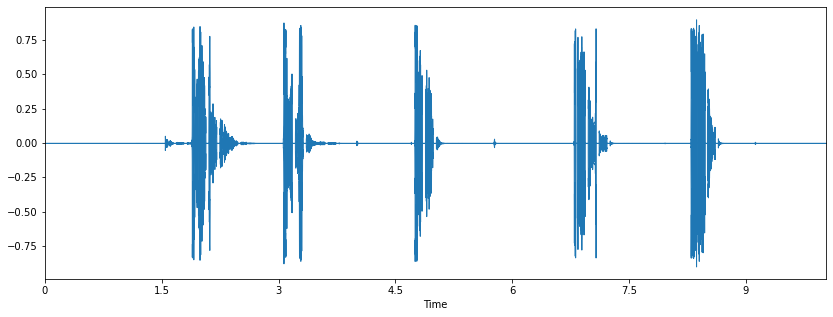

In [26]:
for sample, file in zip(samples, files):
    x, sr = sample
    plt.figure(figsize=(14, 5))
    librosa.display.waveplot(x, sr=sr)
    IPython.display.display(ipd.Audio(file))